<a class="anchor" id="About_Data"></a>
# <p style="padding:10px;background-color:lightblue;margin:0;color:#c27849;font-family:newtimeroman;font-size:150%;text-align:center;border-radius: 15px 50px;overflow:hidden;font-weight:500">Patient Survival Prediction</p> 

## Problem Statement

<div style="background-color:#d5eae9; padding:20px; font-size:15px">
Description: Getting a rapid understanding of the context of a patient’s overall health has been particularly important during the COVID-19 pandemic as healthcare workers around the world struggle with hospitals overloaded by patients in critical condition. Intensive Care Units (ICUs) often lack verified medical histories for incoming patients. A patient in distress or a patient who is brought in confused or unresponsive may not be able to provide information about chronic conditions such as heart disease, injuries, or diabetes. Medical records may take days to transfer, especially for a patient from another medical provider or system. Knowledge about chronic conditions can inform clinical decisions about patient care and ultimately improve patient's survival outcomes.

In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import plotly.express as px
import plotly.graph_objs as go
import plotly.offline as py
from tqdm import tqdm
from sklearn.model_selection import train_test_split, GridSearchCV
from sklearn.metrics import (accuracy_score, 
                            classification_report,
                            roc_auc_score, roc_curve, auc, precision_recall_curve,
                            confusion_matrix)


import plotly.tools as tls
from xgboost import XGBClassifier
from sklearn.ensemble import ExtraTreesClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import StratifiedKFold, KFold

import warnings
warnings.filterwarnings('ignore')

pd.set_option('display.max_rows',250)
pd.set_option('display.max_colwidth', 250)

In [2]:
dic = pd.read_csv(r"F:\Projects\Patient\Patient Survival Detection\Data_Dictionary.csv")

In [3]:
dic

,Category,Variable Name,Unit of Measure,Data Type,Description,Example
0,identifier,encounter_id,None,integer,Unique identifier associated with a patient unit stay,None
1,identifier,hospital_id,None,integer,Unique identifier associated with a hospital,None
2,identifier,patient_id,None,integer,Unique identifier associated with a patient,None
3,demographic,hospital_death,None,binary,Whether the patient died during this hospitalization,0
4,demographic,age,Years,numeric,The age of the patient on unit admission,None
5,demographic,bmi,kilograms/metres^2,string,The body mass index of the person on unit admission,21.5
6,demographic,elective_surgery,None,binary,Whether the patient was admitted to the hospital for an elective surgical operation,0
7,demographic,ethnicity,None,string,The common national or cultural tradition which the person belongs to,Caucasian
8,demographic,gender,None,string,The genotypical sex of the patient,F
9,demographic,height,centimetres,numeric,The height of the person on unit admission,180


In [4]:
df = pd.read_csv(r"F:\Projects\Patient\Patient Survival Detection\Dataset.csv")

In [5]:
df.head()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,66154,25312,118,0,68.0,22.73,0,Caucasian,M,180.3,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,114252,59342,81,0,77.0,27.42,0,Caucasian,F,160.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,119783,50777,118,0,25.0,31.95,0,Caucasian,F,172.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,79267,46918,118,0,81.0,22.64,1,Caucasian,F,165.1,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,92056,34377,33,0,19.0,NaN,0,Caucasian,M,188.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma


In [6]:
df.shape

(91713, 186)

In [7]:
df.info(verbose = True)

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 91713 entries, 0 to 91712
Data columns (total 186 columns):
 #    Column                         Dtype  
---   ------                         -----  
 0    encounter_id                   int64  
 1    patient_id                     int64  
 2    hospital_id                    int64  
 3    hospital_death                 int64  
 4    age                            float64
 5    bmi                            float64
 6    elective_surgery               int64  
 7    ethnicity                      object 
 8    gender                         object 
 9    height                         float64
 10   hospital_admit_source          object 
 11   icu_admit_source               object 
 12   icu_id                         int64  
 13   icu_stay_type                  object 
 14   icu_type                       object 
 15   pre_icu_los_days               float64
 16   readmission_status             int64  
 17   weight                       

In [8]:
df.describe()

,encounter_id,patient_id,hospital_id,hospital_death,age,bmi,elective_surgery,height,icu_id,pre_icu_los_days,...,apache_4a_hospital_death_prob,apache_4a_icu_death_prob,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis
count,91713.000000,91713.000000,91713.000000,91713.000000,87485.000000,88284.000000,91713.000000,90379.000000,91713.000000,91713.000000,...,83766.000000,83766.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000,90998.000000
mean,65606.079280,65537.131464,105.669262,0.086302,62.309516,29.185818,0.183736,169.641588,508.357692,0.835766,...,0.086787,0.043955,0.000857,0.015693,0.225192,0.012989,0.026165,0.007066,0.004132,0.020638
std,37795.088538,37811.252183,62.854406,0.280811,16.775119,8.275142,0.387271,10.795378,228.989661,2.487756,...,0.247569,0.217341,0.029265,0.124284,0.417711,0.113229,0.159628,0.083763,0.064148,0.142169
min,1.000000,1.000000,2.000000,0.000000,16.000000,14.844926,0.000000,137.200000,82.000000,-24.947222,...,-1.000000,-1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,32852.000000,32830.000000,47.000000,0.000000,52.000000,23.641975,0.000000,162.500000,369.000000,0.035417,...,0.020000,0.010000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,65665.000000,65413.000000,109.000000,0.000000,65.000000,27.654655,0.000000,170.100000,504.000000,0.138889,...,0.050000,0.020000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
75%,98342.000000,98298.000000,161.000000,0.000000,75.000000,32.930206,0.000000,177.800000,679.000000,0.409028,...,0.130000,0.060000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
max,131051.000000,131051.000000,204.000000,1.000000,89.000000,67.814990,1.000000,195.590000,927.000000,159.090972,...,0.990000,0.970000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000,1.000000


In [9]:
df['hospital_death'].unique()

array([0, 1], dtype=int64)

In [10]:
df.isnull().sum(axis=0).sort_values(ascending = False)

h1_bilirubin_min                 84619
h1_bilirubin_max                 84619
h1_lactate_max                   84369
h1_lactate_min                   84369
h1_albumin_max                   83824
h1_albumin_min                   83824
h1_pao2fio2ratio_min             80195
h1_pao2fio2ratio_max             80195
h1_arterial_ph_max               76424
h1_arterial_ph_min               76424
h1_hco3_max                      76094
h1_hco3_min                      76094
h1_arterial_pco2_min             75959
h1_arterial_pco2_max             75959
h1_wbc_max                       75953
h1_wbc_min                       75953
h1_arterial_po2_max              75945
h1_arterial_po2_min              75945
h1_calcium_max                   75863
h1_calcium_min                   75863
h1_platelets_max                 75673
h1_platelets_min                 75673
h1_bun_max                       75091
h1_bun_min                       75091
h1_creatinine_max                74957
h1_creatinine_min        

In [11]:
large_missing = df.isnull().sum(axis=0).sort_values(ascending = False)[df.isnull().sum(axis=0).sort_values(ascending = False)>25000]

In [12]:
large_missing

h1_bilirubin_min          84619
h1_bilirubin_max          84619
h1_lactate_max            84369
h1_lactate_min            84369
h1_albumin_max            83824
h1_albumin_min            83824
h1_pao2fio2ratio_min      80195
h1_pao2fio2ratio_max      80195
h1_arterial_ph_max        76424
h1_arterial_ph_min        76424
h1_hco3_max               76094
h1_hco3_min               76094
h1_arterial_pco2_min      75959
h1_arterial_pco2_max      75959
h1_wbc_max                75953
h1_wbc_min                75953
h1_arterial_po2_max       75945
h1_arterial_po2_min       75945
h1_calcium_max            75863
h1_calcium_min            75863
h1_platelets_max          75673
h1_platelets_min          75673
h1_bun_max                75091
h1_bun_min                75091
h1_creatinine_max         74957
h1_creatinine_min         74957
h1_diasbp_invasive_min    74928
h1_diasbp_invasive_max    74928
h1_sysbp_invasive_max     74915
h1_sysbp_invasive_min     74915
h1_mbp_invasive_min       74844
h1_mbp_i

In [13]:
df.drop(large_missing.index.tolist() + ['encounter_id', 'hospital_admit_source','icu_admit_source','icu_id', 'icu_stay_type','patient_id','hospital_id','readmission_status'],
         axis = 1, inplace=True)

In [14]:
df

,hospital_death,age,bmi,elective_surgery,ethnicity,gender,height,icu_type,pre_icu_los_days,weight,...,aids,cirrhosis,diabetes_mellitus,hepatic_failure,immunosuppression,leukemia,lymphoma,solid_tumor_with_metastasis,apache_3j_bodysystem,apache_2_bodysystem
0,0,68.0,22.730000,0,Caucasian,M,180.3,CTICU,0.541667,73.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
1,0,77.0,27.420000,0,Caucasian,F,160.0,Med-Surg ICU,0.927778,70.2,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory
2,0,25.0,31.950000,0,Caucasian,F,172.7,Med-Surg ICU,0.000694,95.3,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
3,0,81.0,22.640000,1,Caucasian,F,165.1,CTICU,0.000694,61.7,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Cardiovascular,Cardiovascular
4,0,19.0,NaN,0,Caucasian,M,188.0,Med-Surg ICU,0.073611,NaN,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Trauma,Trauma
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
91708,0,75.0,23.060250,0,Caucasian,M,177.8,Cardiac ICU,0.298611,72.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,1.0,Sepsis,Cardiovascular
91709,0,56.0,47.179671,0,Caucasian,F,183.0,Med-Surg ICU,0.120139,158.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Sepsis,Cardiovascular
91710,0,48.0,27.236914,0,Caucasian,M,170.2,Med-Surg ICU,0.046528,78.9,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,Metabolic,Metabolic
91711,0,NaN,23.297481,0,Caucasian,F,154.9,Med-Surg ICU,0.081944,55.9,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,Respiratory,Respiratory


In [15]:
df = df[df[['bmi','weight','height']].isnull().sum(axis=1) == 0]

In [16]:
df.isna().sum()

hospital_death                       0
age                               4055
bmi                                  0
elective_surgery                     0
ethnicity                         1211
gender                              18
height                               0
icu_type                             0
pre_icu_los_days                     0
weight                               0
apache_2_diagnosis                1566
apache_3j_diagnosis               1026
apache_post_operative                0
arf_apache                         684
bun_apache                       18289
creatinine_apache                17926
gcs_eyes_apache                   1794
gcs_motor_apache                  1794
gcs_unable_apache                  951
gcs_verbal_apache                 1794
glucose_apache                   10473
heart_rate_apache                  809
hematocrit_apache                19005
intubated_apache                   684
map_apache                         913
resprate_apache          

## Univariate - Multivariate Analysis

In [17]:
fig = px.histogram(df[['age','gender','hospital_death','bmi']].dropna(), x = 'age', y = 'hospital_death', color = 'gender', marginal= 'box',
                          hover_data= df[['age','gender','hospital_death','bmi']].columns )
fig.show()

**<span style="color: midnightblue;">Average hospital death probability of patients</span>**  
*based on age and gender*

In [18]:
age_death_F = df[df['gender'] == 'F'][['age','hospital_death']].groupby('age').mean().reset_index()
age_death_M = df[df['gender'] == 'M'][['age','hospital_death']].groupby('age').mean().reset_index()

from plotly.subplots import make_subplots

fig = make_subplots()
fig.add_trace(go.Scatter(x = age_death_F['age'], y = age_death_F['hospital_death'], name = 'Female Patients'))
fig.add_trace(go.Scatter(x = age_death_M['age'], y = age_death_M['hospital_death'], name = 'Male Patients'))

fig.update_layout(title_text = '<b> Average hospital death by possibility <b>')
fig.update_xaxes(title_text = '<b> Patient Age <b>')
fig.update_yaxes(title_text = '<b> Average Hospital death <b>', secondary_y = False)
fig.show()

**<span style="color: midnightblue;">impacts of BMI and weight over patients</span>**

In [19]:
weight_df = df[['weight','hospital_death', 'bmi']]
weight_df['weight'] = weight_df['weight'].round(0)
weight_df['bmi'] = weight_df['bmi'].round(0)
weight_death = weight_df[['weight', 'hospital_death']].groupby('weight').mean().reset_index()
bmi_death = weight_df[['bmi', 'hospital_death']].groupby('bmi').mean().reset_index()
fig = make_subplots(rows = 1, cols = 1, shared_yaxes = True)
fig.add_trace(
go.Scatter(x = weight_death['weight'], y = weight_death['hospital_death'], name = 'Weight'), 
)

fig.add_trace(
    go.Scatter(x=bmi_death['bmi'], y=bmi_death['hospital_death'], name="BMI"),
)

fig.update_layout(
    title_text = "<b>Impacts of BMI and weight over patients<b>"
)
fig.update_yaxes(title_text = "<b>Average Hospital Death")
fig.show()


**<span style="color: midnightblue;">Survival rate at different types of ICU</span>**

*some of the ICU wards have higher death probability pertaining to being surgical wards*

In [20]:
ICU_type = df[['icu_type','age','hospital_death']]
ICU_type['icu_type'] = ICU_type['icu_type'].replace({'CTICU':'CCU-CTICU',
                                              'Cardiac ICU':'CCT-CTICU',
                                              'CTICU':'CCT-CTICU',
                                              'CSICU':'SICU'})
ICU_df = ICU_type.groupby(['icu_type','age']).mean().reset_index()
ICU_df['count'] = ICU_type.groupby(['icu_type','age']).count().reset_index()['hospital_death']

fig = px.scatter(ICU_df, x = 'age', y='hospital_death', size = 'count', color = 'icu_type',
               hover_name = 'icu_type', log_x = False, size_max = 60, )
fig.update_layout(
       title_text="<b>Survival rate at different types of ICU<b>"
)
fig.update_yaxes(title_text="<b>Average Hospital Death<b>")
fig.update_xaxes(title_text="<b>Age<b>")
fig.show()

**<span style="color: midnightblue;">Hospital Death Rate, by age and Medical condition</span>**

In [21]:
apache3=df[['age','apache_3j_bodysystem','hospital_death']]
apache3=apache3.groupby(['apache_3j_bodysystem','age']).agg(['size','mean']).reset_index()

apache3['size']=apache3['hospital_death']['size']
apache3['mean']=apache3['hospital_death']['mean']

apache3.drop('hospital_death',axis=1,inplace=True)

systems =list(apache3['apache_3j_bodysystem'].unique())
data = []
list_updatemenus = []
for n, s in enumerate(systems):
    visible = [False] * len(systems)
    visible[n] = True
    temp_dict = dict(label = str(s),
                 method = 'update',
                 args = [{'visible': visible},
                         {'title': '<b>'+s+'<b>'}])
    list_updatemenus.append(temp_dict)
    

for s in systems:
    mask = (apache3['apache_3j_bodysystem'].values == s) 
    trace = (dict(visible = False,     
        x = apache3.loc[mask, 'age'],
        y = apache3.loc[mask, 'mean'],
        mode = 'markers',
        marker = {'size':apache3.loc[mask, 'size']/apache3.loc[mask,'size'].sum()*1000,
                 'color':apache3.loc[mask, 'mean'],
                 'showscale': True})
                   )
    data.append(trace)

data[0]['visible'] = True    
    
layout = dict(updatemenus=list([dict(buttons= list_updatemenus)]),
              xaxis=dict(title = '<b>Age<b>', range=[min(apache3.loc[:, 'age'])-10, max(apache3.loc[:, 'age']) + 10]),
              yaxis=dict(title = '<b>Average Hospital Death<b>', range=[min(apache3.loc[:, 'mean'])-0.1, max(apache3.loc[:, 'mean'])+0.1]),
              title='<b>Survival Rate<b>' )
fig = dict(data=data, layout=layout)
py.iplot(fig, filename='update_dropdown')

**Density Distribution for numerical columns**

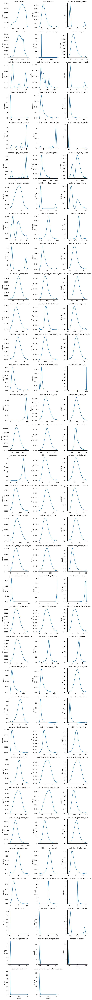

In [22]:
unpivot = pd.melt(df, df.describe().columns[0], df.describe().columns[1:])

g = sns.FacetGrid(unpivot, col="variable", col_wrap=3, sharex=False, sharey=False)
g.map(sns.kdeplot, "value")

plt.show()

# Preprocessing

converting categorical values  
tranforming numerical columns and removing nulls

Null values for *categories* are replaced by **mode**, and those for *numerical* are replaced by **mean**

In [23]:
df['elective_surgery']

0        0
1        0
2        0
3        1
5        0
        ..
91708    0
91709    0
91710    0
91711    0
91712    1
Name: elective_surgery, Length: 88284, dtype: int64

In [24]:
df['apache_post_operative']

0        0
1        0
2        0
3        1
5        0
        ..
91708    0
91709    0
91710    0
91711    0
91712    1
Name: apache_post_operative, Length: 88284, dtype: int64

In [25]:
df['arf_apache']

0        0.0
1        0.0
2        0.0
3        0.0
5        0.0
        ... 
91708    0.0
91709    0.0
91710    0.0
91711    0.0
91712    0.0
Name: arf_apache, Length: 88284, dtype: float64

In [26]:
df['gcs_unable_apache']

0        0.0
1        0.0
2        0.0
3        0.0
5        0.0
        ... 
91708    0.0
91709    0.0
91710    0.0
91711    0.0
91712    0.0
Name: gcs_unable_apache, Length: 88284, dtype: float64

In [27]:
df.nunique()[df.nunique() == 2].index.tolist()

['hospital_death',
 'elective_surgery',
 'gender',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

In [28]:
numerical_cat = [
 'elective_surgery',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis']

categorical = ['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [29]:
df.select_dtypes(include='O').columns.values.tolist()

['ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem']

In [30]:
not_numeric = df[numerical_cat + categorical + ['hospital_death']].columns.tolist()

In [31]:
not_numeric

['elective_surgery',
 'apache_post_operative',
 'arf_apache',
 'gcs_unable_apache',
 'intubated_apache',
 'ventilated_apache',
 'aids',
 'cirrhosis',
 'diabetes_mellitus',
 'hepatic_failure',
 'immunosuppression',
 'leukemia',
 'lymphoma',
 'solid_tumor_with_metastasis',
 'ethnicity',
 'gender',
 'icu_type',
 'apache_3j_bodysystem',
 'apache_2_bodysystem',
 'hospital_death']

In [32]:
numeric_only = df.drop(not_numeric,axis=1).columns.tolist()
numeric_only

['age',
 'bmi',
 'height',
 'pre_icu_los_days',
 'weight',
 'apache_2_diagnosis',
 'apache_3j_diagnosis',
 'bun_apache',
 'creatinine_apache',
 'gcs_eyes_apache',
 'gcs_motor_apache',
 'gcs_verbal_apache',
 'glucose_apache',
 'heart_rate_apache',
 'hematocrit_apache',
 'map_apache',
 'resprate_apache',
 'sodium_apache',
 'temp_apache',
 'wbc_apache',
 'd1_diasbp_max',
 'd1_diasbp_min',
 'd1_diasbp_noninvasive_max',
 'd1_diasbp_noninvasive_min',
 'd1_heartrate_max',
 'd1_heartrate_min',
 'd1_mbp_max',
 'd1_mbp_min',
 'd1_mbp_noninvasive_max',
 'd1_mbp_noninvasive_min',
 'd1_resprate_max',
 'd1_resprate_min',
 'd1_spo2_max',
 'd1_spo2_min',
 'd1_sysbp_max',
 'd1_sysbp_min',
 'd1_sysbp_noninvasive_max',
 'd1_sysbp_noninvasive_min',
 'd1_temp_max',
 'd1_temp_min',
 'h1_diasbp_max',
 'h1_diasbp_min',
 'h1_diasbp_noninvasive_max',
 'h1_diasbp_noninvasive_min',
 'h1_heartrate_max',
 'h1_heartrate_min',
 'h1_mbp_max',
 'h1_mbp_min',
 'h1_mbp_noninvasive_max',
 'h1_mbp_noninvasive_min',
 'h1_re

In [33]:
for col in numerical_cat:
    df[col] = df[col].astype('Int64')

for col in numerical_cat:
    df[col] = df[col].fillna(df[col].mode()[0])

In [34]:
df.isna().sum()

hospital_death                       0
age                               4055
bmi                                  0
elective_surgery                     0
ethnicity                         1211
gender                              18
height                               0
icu_type                             0
pre_icu_los_days                     0
weight                               0
apache_2_diagnosis                1566
apache_3j_diagnosis               1026
apache_post_operative                0
arf_apache                           0
bun_apache                       18289
creatinine_apache                17926
gcs_eyes_apache                   1794
gcs_motor_apache                  1794
gcs_unable_apache                    0
gcs_verbal_apache                 1794
glucose_apache                   10473
heart_rate_apache                  809
hematocrit_apache                19005
intubated_apache                     0
map_apache                         913
resprate_apache          

In [35]:
df[numeric_only].isna().sum(axis = 0).sort_values(ascending = False)

wbc_apache                       21063
h1_temp_max                      20833
h1_temp_min                      20833
hematocrit_apache                19005
bun_apache                       18289
creatinine_apache                17926
sodium_apache                    17644
d1_hco3_max                      14390
d1_hco3_min                      14390
d1_platelets_min                 12767
d1_platelets_max                 12767
d1_wbc_max                       12501
d1_wbc_min                       12501
d1_calcium_min                   12315
d1_calcium_max                   12315
d1_hemaglobin_max                11519
d1_hemaglobin_min                11519
d1_hematocrit_max                11051
d1_hematocrit_min                11051
glucose_apache                   10473
d1_bun_min                        9860
d1_bun_max                        9860
d1_creatinine_min                 9561
d1_creatinine_max                 9561
d1_sodium_max                     9554
d1_sodium_min            

In [36]:
split_one = df[numeric_only].isna().sum(axis = 0).sort_values()[df[numeric_only].isna().sum(axis = 0)<11000].index.tolist()
split_two = df[numeric_only].isna().sum(axis = 0).sort_values()[df[numeric_only].isna().sum(axis = 0)>11000].index.tolist()

In [37]:
split_two

['d1_hematocrit_max',
 'd1_hematocrit_min',
 'd1_hemaglobin_min',
 'd1_hemaglobin_max',
 'd1_calcium_max',
 'd1_calcium_min',
 'd1_wbc_max',
 'd1_wbc_min',
 'd1_platelets_min',
 'd1_platelets_max',
 'd1_hco3_max',
 'd1_hco3_min',
 'sodium_apache',
 'creatinine_apache',
 'bun_apache',
 'hematocrit_apache',
 'h1_temp_min',
 'h1_temp_max',
 'wbc_apache']

In [38]:
for col in split_two:
    df[col] = df[col].fillna(df[col].mean())
process_data = df.dropna(axis=0)

In [39]:
process_data.isna().sum()

hospital_death                   0
age                              0
bmi                              0
elective_surgery                 0
ethnicity                        0
gender                           0
height                           0
icu_type                         0
pre_icu_los_days                 0
weight                           0
apache_2_diagnosis               0
apache_3j_diagnosis              0
apache_post_operative            0
arf_apache                       0
bun_apache                       0
creatinine_apache                0
gcs_eyes_apache                  0
gcs_motor_apache                 0
gcs_unable_apache                0
gcs_verbal_apache                0
glucose_apache                   0
heart_rate_apache                0
hematocrit_apache                0
intubated_apache                 0
map_apache                       0
resprate_apache                  0
sodium_apache                    0
temp_apache                      0
ventilated_apache   

In [40]:
process_data[categorical].nunique()

ethnicity                6
gender                   2
icu_type                 8
apache_3j_bodysystem    11
apache_2_bodysystem     10
dtype: int64

using one-hot encoder because of large range of **unique values** in categories

In [41]:
icu_data = pd.get_dummies(process_data, 
                          prefix = 'isin',
                          prefix_sep = '_',
                          columns = categorical,
                          drop_first = False
                         )
icu_data.reset_index(drop = True, inplace = True)
icu_data

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,isin_Cardiovascular,isin_Gastrointestinal,isin_Haematologic,isin_Metabolic,isin_Neurologic,isin_Renal/Genitourinary,isin_Respiratory,isin_Trauma,isin_Undefined Diagnoses,isin_Undefined diagnoses
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,...,1,0,0,0,0,0,0,0,0,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,...,0,0,0,0,0,0,1,0,0,0
2,0,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,...,0,0,0,0,1,0,0,0,0,0
3,0,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0,...,0,0,0,0,0,0,1,0,0,0
4,0,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0,...,1,0,0,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53108,0,47.0,51.439842,1,195.0,0.033333,186.0,304.0,1406.01,1,...,0,1,0,0,0,0,0,0,0,0
53109,0,54.0,19.770448,0,177.8,0.025694,62.5,109.0,108.01,0,...,1,0,0,0,0,0,0,0,0,0
53110,0,75.0,23.060250,0,177.8,0.298611,72.9,113.0,501.06,0,...,1,0,0,0,0,0,0,0,0,0
53111,0,56.0,47.179671,0,183.0,0.120139,158.0,113.0,501.05,0,...,1,0,0,0,0,0,0,0,0,0


In [42]:
icu_data.columns = [x.lower() for x in icu_data.columns.tolist()]
icu_data = icu_data.loc[:,~icu_data.columns.duplicated()]

In [43]:
icu_data

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,isin_metabolic,isin_musculoskeletal/skin,isin_neurological,isin_respiratory,isin_sepsis,isin_trauma,isin_haematologic,isin_neurologic,isin_renal/genitourinary,isin_undefined diagnoses
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,...,0,0,0,0,1,0,0,0,0,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,...,0,0,0,1,0,0,0,0,0,0
2,0,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,...,0,0,1,0,0,0,0,1,0,0
3,0,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0,...,0,0,0,1,0,0,0,0,0,0
4,0,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53108,0,47.0,51.439842,1,195.0,0.033333,186.0,304.0,1406.01,1,...,0,0,0,0,0,0,0,0,0,0
53109,0,54.0,19.770448,0,177.8,0.025694,62.5,109.0,108.01,0,...,0,0,0,0,0,0,0,0,0,0
53110,0,75.0,23.060250,0,177.8,0.298611,72.9,113.0,501.06,0,...,0,0,0,0,1,0,0,0,0,0
53111,0,56.0,47.179671,0,183.0,0.120139,158.0,113.0,501.05,0,...,0,0,0,0,1,0,0,0,0,0


In [44]:
t = icu_data['arf_apache'].dtype

for col in tqdm(icu_data.columns.tolist()):
    if icu_data[col].values.dtype == 'uint8' or t == icu_data[col].values.dtype:
        icu_data[col] = icu_data[col].astype(int)

100%|██████████████████████████████████████████████████████████████████████████████| 130/130 [00:00<00:00, 3539.89it/s]


In [45]:
icu_data.dtypes

hospital_death                     int64
age                              float64
bmi                              float64
elective_surgery                   int32
height                           float64
pre_icu_los_days                 float64
weight                           float64
apache_2_diagnosis               float64
apache_3j_diagnosis              float64
apache_post_operative              int32
arf_apache                         int32
bun_apache                       float64
creatinine_apache                float64
gcs_eyes_apache                  float64
gcs_motor_apache                 float64
gcs_unable_apache                  int32
gcs_verbal_apache                float64
glucose_apache                   float64
heart_rate_apache                float64
hematocrit_apache                float64
intubated_apache                   int32
map_apache                       float64
resprate_apache                  float64
sodium_apache                    float64
temp_apache     

In [46]:
icu_data

,hospital_death,age,bmi,elective_surgery,height,pre_icu_los_days,weight,apache_2_diagnosis,apache_3j_diagnosis,apache_post_operative,...,isin_metabolic,isin_musculoskeletal/skin,isin_neurological,isin_respiratory,isin_sepsis,isin_trauma,isin_haematologic,isin_neurologic,isin_renal/genitourinary,isin_undefined diagnoses
0,0,68.0,22.730000,0,180.3,0.541667,73.9,113.0,502.01,0,...,0,0,0,0,1,0,0,0,0,0
1,0,77.0,27.420000,0,160.0,0.927778,70.2,108.0,203.01,0,...,0,0,0,1,0,0,0,0,0,0
2,0,67.0,27.560000,0,190.5,0.000694,100.0,301.0,403.01,0,...,0,0,1,0,0,0,0,1,0,0
3,0,46.0,25.845717,0,167.6,0.000000,72.6,108.0,203.01,0,...,0,0,0,1,0,0,0,0,0,0
4,0,87.0,21.963763,0,180.3,5.046528,71.4,113.0,501.05,0,...,0,0,0,0,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
53108,0,47.0,51.439842,1,195.0,0.033333,186.0,304.0,1406.01,1,...,0,0,0,0,0,0,0,0,0,0
53109,0,54.0,19.770448,0,177.8,0.025694,62.5,109.0,108.01,0,...,0,0,0,0,0,0,0,0,0,0
53110,0,75.0,23.060250,0,177.8,0.298611,72.9,113.0,501.06,0,...,0,0,0,0,1,0,0,0,0,0
53111,0,56.0,47.179671,0,183.0,0.120139,158.0,113.0,501.05,0,...,0,0,0,0,1,0,0,0,0,0


In [47]:
icu_data.to_csv('icu_data.csv', index=False)

## Modelling

In [48]:
X = icu_data.drop(['hospital_death'], axis = 1)
y = icu_data['hospital_death']
X_train, X_test, y_train, y_test = train_test_split(X,y, test_size = 0.30, random_state = 42, stratify = y)

In [49]:
y_train.value_counts()

0    33923
1     3256
Name: hospital_death, dtype: int64

In [50]:
y_test.value_counts()

0    14538
1     1396
Name: hospital_death, dtype: int64

In [51]:
def modelling(X_train, y_train, X_test, y_test, **kwargs):
    scores = {}
    models = []
    
    if 'xgb' in kwargs.keys() and kwargs['xgb']:
        xgb = XGBClassifier()
        xgb.fit(X_train._get_numeric_data(), np.ravel(y_train, order = 'C'))
        y_pred = xgb.predict(X_test._get_numeric_data())
        scores['xgb'] = [accuracy_score(y_test,y_pred), roc_auc_score(y_test,y_pred)]
        models.append(xgb)
        
    if 'rf' in kwargs.keys() and kwargs['rf']:
        rf = RandomForestClassifier(n_estimators = 200)
        rf.fit(X_train, y_train)
        y_pred = rf.predict(X_test)
        scores['rf'] = [accuracy_score(y_test, y_pred), roc_auc_score(y_test, y_pred)]
        models.append(rf)
        
#    if 'extree' in kwargs.keys() and kwargs['extree']:
#        extree = ExtraTreeClassifier()
#        extree.fit(X_train, y_train)
#        y_pred = extree.predict(X_test)
#        scores['extree'] = [accuracy_score(y_test, y_pred), roc_auc_score(y_test, y_pred)]
#        models.append(extree)
        
    return scores

In [52]:
modelling(X_train, y_train, X_test, y_test, xgb = True, rf = True)

{'xgb': [0.9239362369775324, 0.6471697430821548],
 'rf': [0.9273879753985189, 0.6276922823735129]}

In [53]:
def model_performance(model, y_test, y_hat) : 
    conf_matrix = confusion_matrix(y_test, y_hat)
    trace1 = go.Heatmap(z = conf_matrix  ,x = ["0 (pred)","1 (pred)"],
                        y = ["0 (true)","1 (true)"],xgap = 2, ygap = 2, 
                        colorscale = 'Viridis', showscale  = False)

    #Show metrics
    tp = conf_matrix[1,1]
    fn = conf_matrix[1,0]
    fp = conf_matrix[0,1]
    tn = conf_matrix[0,0]
    Accuracy  =  ((tp+tn)/(tp+tn+fp+fn))
    Precision =  (tp/(tp+fp))
    Recall    =  (tp/(tp+fn))
    F1_score  =  (2*(((tp/(tp+fp))*(tp/(tp+fn)))/((tp/(tp+fp))+(tp/(tp+fn)))))

    show_metrics = pd.DataFrame(data=[[Accuracy , Precision, Recall, F1_score]])
    show_metrics = show_metrics.T

    colors = ['gold', 'lightgreen', 'lightcoral', 'lightskyblue']
    trace2 = go.Bar(x = (show_metrics[0].values), 
                   y = ['Accuracy', 'Precision', 'Recall', 'F1_score'], text = np.round_(show_metrics[0].values,4),
                    textposition = 'auto',
                   orientation = 'h', opacity = 0.8,marker=dict(
            color=colors,
            line=dict(color='#000000',width=1.5)))
    
    #Roc curve
    model_roc_auc = round(roc_auc_score(y_test, y_hat) , 3)
    fpr, tpr, t = roc_curve(y_test, y_hat)
    trace3 = go.Scatter(x = fpr,y = tpr,
                        name = "Roc : " + str(model_roc_auc),
                        line = dict(color = ('rgb(22, 96, 167)'),width = 2), fill='tozeroy')
    trace4 = go.Scatter(x = [0,1],y = [0,1],
                        line = dict(color = ('black'),width = 1.5,
                        dash = 'dot'))
    
    # Precision-recall curve
    precision, recall, thresholds = precision_recall_curve(y_test, y_hat)
    trace5 = go.Scatter(x = recall, y = precision,
                        name = "Precision" + str(precision),
                        line = dict(color = ('lightcoral'),width = 2), fill='tozeroy')
    
     
    #plots
    model = model
    
    #Subplots
    fig = tls.make_subplots(rows=2, cols=2, print_grid=False, 
                          specs=[ 
#                               [{'colspan': 2}, None],
                                 [{}, {}],
                                 [{}, {}],
                                 
#                                  [{'colspan': 2}, None]
                                ],
                          subplot_titles=('Confusion Matrix',
                                        'Metrics',
                                        'ROC curve'+" "+ '('+ str(model_roc_auc)+')',
                                        'Precision - Recall curve',
                                        ))
    
    fig.append_trace(trace1,1,1)
    fig.append_trace(trace2,1,2)
    fig.append_trace(trace3,2,1)
    fig.append_trace(trace4,2,1)
    fig.append_trace(trace5,2,2)
    
    fig['layout'].update(showlegend = False, title = '<b>Model performance report</b><br>'+str(model),
                        autosize = False, height = 1500,width = 830,
                        plot_bgcolor = 'rgba(240,240,240, 0.95)',
                        paper_bgcolor = 'rgba(240,240,240, 0.95)',
                        margin = dict(b = 195))
    fig.layout.titlefont.size = 14
    
    py.iplot(fig)

## Parameter Tuning

In [54]:
gkf = KFold(n_splits=3, shuffle=True, random_state=42).split(X=X_train, y=y_train)

fit_params_of_xgb = {
    "early_stopping_rounds":100, 
    "eval_metric" : 'auc', 
    "eval_set" : [(X_test, y_test)],
    'verbose': 100,
}


# A parameter grid for XGBoost
params = {
    'booster': ["gbtree"],
    'learning_rate': [0.1],
    'n_estimators': range(100, 500, 100),
    'min_child_weight': [1],
    'gamma': [0],
    'subsample': [0.8],
    'colsample_bytree': [0.8],
    'max_depth': [5],
    "scale_pos_weight": [1]
}

xgb_estimator = XGBClassifier(
    objective='binary:logistic',
    # silent=True,
)

gsearch = GridSearchCV(
    estimator=xgb_estimator,
    param_grid=params,
    scoring='roc_auc',
    n_jobs=-1,
    cv=gkf
)

xgb_model = gsearch.fit(X=X_train, y=y_train, **fit_params_of_xgb)
(gsearch.best_params_, gsearch.best_score_)

[0]	validation_0-auc:0.85606
[99]	validation_0-auc:0.88580


({'booster': 'gbtree',
  'colsample_bytree': 0.8,
  'gamma': 0,
  'learning_rate': 0.1,
  'max_depth': 5,
  'min_child_weight': 1,
  'n_estimators': 100,
  'scale_pos_weight': 1,
  'subsample': 0.8},
 0.8871902637351218)

## Final Model Evaluation

In [55]:
xgb_tuned = XGBClassifier(n_estimators=3000,
    objective='binary:logistic',
    booster="gbtree",
    learning_rate=0.01,
    scale_pos_weight=1,
    max_depth=4,
    min_child_weight=6,
    gamma=0,
    subsample=0.4,
    colsample_bytree=0.8,
    reg_alpha=0.08,
    n_jobs=-1)

xgb_tuned.fit(X_train._get_numeric_data(), np.ravel(y_train, order='C'))
y__hat = xgb_tuned.predict(X_test._get_numeric_data())

In [56]:
y__hat[21:30]

array([0, 0, 0, 0, 0, 1, 0, 0, 1])

In [57]:
model_performance(xgb_tuned,y_test, y__hat)